In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
N_THREADS = '4'
os.environ['OMP_NUM_THREADS'] = N_THREADS
os.environ['OPENBLAS_NUM_THREADS'] = N_THREADS
os.environ['MKL_NUM_THREADS'] = N_THREADS
os.environ['VECLIB_MAXIMUM_THREADS'] = N_THREADS
os.environ['NUMEXPR_NUM_THREADS'] = N_THREADS


In [4]:
from pyprojroot import here
import sys

sys.path.insert(0, str(here()))


import pandas as pd
from pandas_datareader.wb import WorldBankReader

from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from laos_gggi.plotting import prepare_gridspec_figure

import gEconpy as ge
import gEconpy.plotting as gp

import nutpie as ntp
from pymc.model.transform.optimization import freeze_dims_and_data
import optax

In [5]:
indicators = {'NY.GDP.MKTP.KD': 'gdp',
              'SL.UEM.TOTL.ZS': 'unemployment',
              'SP.POP.TOTL': 'population',
              "SL.TLF.CACT.ZS": "labor_participation",
              'FP.CPI.TOTL.ZG': 'cpi_inflation',
              'FR.INR.LEND': "lending_rate",
              'FR.INR.RINR': 'real_interest',
              "NE.GDI.FTOT.KD": 'capital_formation',
              "NE.CON.PRVT.KD": 'hh_consumption',
              "NE.CON.GOVT.KD": 'gov_consumption'}

lao_wb_data_fname = 'laos_world_bank.csv'
data_path = Path(here()) / 'data' / lao_wb_data_fname
FORCE_RELOAD = False

if data_path.exists() or FORCE_RELOAD:
    wb_data = pd.read_csv(data_path, index_col=[0, 1])
else:
    wb_data = WorldBankReader(symbols=list(indicators.keys()),
                              countries=['LAO'],
                              start='1970-01-01',
                              end='2025-01-01').read()
    wb_data.to_csv(data_path)
    
wb_data = (wb_data.rename(columns=indicators)
           .droplevel(axis=0, level=0)
           .reset_index()
           .assign(year = lambda x: pd.to_datetime(x.year, format='%Y'))
           .set_index('year')
           .assign(unemployment = lambda x: x.unemployment / 100,
                   labor_participation = lambda x: x.labor_participation / 100,
                   population = lambda x: x.population / 1e6,
                   lending_rate = lambda x: x.lending_rate / 100,
                   real_interest = lambda x: x.real_interest / 100,
                   gdp = lambda x: x.gdp / 1e6,
                   capital_formation = lambda x: x.capital_formation / 1e6,
                   hh_consumption = lambda x: x.hh_consumption / 1e6,
                   gov_consumption = lambda x: x.gov_consumption / 1e6
                   )
           .assign(working = lambda x: x.population * x.labor_participation * (1 - x.unemployment))
          )

In [6]:
pwt_df = pd.read_csv(here('data/penn_world_table_laopdr.csv'))

code_to_name = pwt_df[['Variable code', 'Variable name']].set_index('Variable code')['Variable name'].to_dict()
short_names = ['depreciation', 
               'engaged',
               'real_return_rate', 
               'P_capital_service', 
               'P_capital_stock',
               'population',
               'total_consumption',
               'domestic_absorption',
               'gdp',
               'capital_services',
               'capital_stock',
               'tfp',
               'xr']

code_to_short = dict(zip(code_to_name.keys(), short_names))

drop_cols = ['ISO code', 'Country', 'Variable name']
pwt_df = (pwt_df
              .drop(columns=drop_cols)
              .set_index('Variable code')
              .T
              .assign(year = lambda x: pd.to_datetime(x.index, format='%Y'))
              .reset_index(drop=True)
              .set_index('year')
              .rename(columns=code_to_short)
         )

code_to_name

{'delta': 'Average depreciation rate of the capital stock',
 'emp': 'Number of persons engaged (in millions)',
 'irr': 'Real internal rate of return',
 'pl_k': 'Price level of the capital services, price level of USA=1',
 'pl_n': 'Price level of the capital stock, price level of USA in 2017=1',
 'pop': 'Population (in millions)',
 'rconna': 'Real consumption at constant 2017 national prices (in mil. 2017US$)',
 'rdana': 'Real domestic absorption at constant 2017 national prices (in mil. 2017US$)',
 'rgdpna': 'Real GDP at constant 2017 national prices (in mil. 2017US$)',
 'rkna': 'Capital services at constant 2017 national prices (2017=1)',
 'rnna': 'Capital stock at constant 2017 national prices (in mil. 2017US$)',
 'rtfpna': 'TFP at constant national prices (2017=1)',
 'xr': 'Exchange rate, national currency/USD (market+estimated)'}

In [7]:
adj_factor = pwt_df.gdp / wb_data.gdp

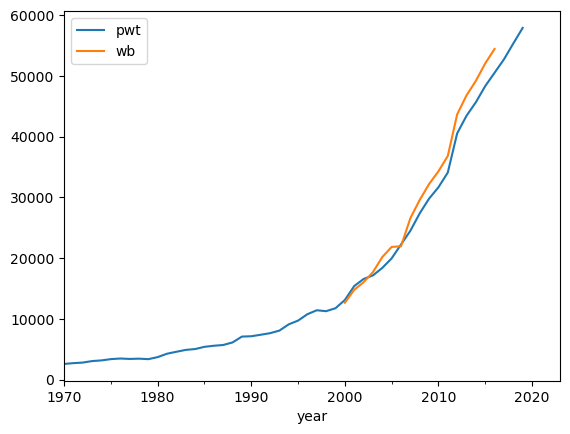

In [8]:
fig, ax = plt.subplots()
pwt_df.domestic_absorption.plot(ax=ax, label='pwt')
(wb_data[['hh_consumption', 'gov_consumption', 'capital_formation']].sum(axis=1) * adj_factor).replace({0.0:np.nan}).plot(ax=ax, label='wb')
ax.legend()

In [9]:
x = np.flip(np.eye(5), 1)

In [10]:
z = np.random.normal(size=(5,))
z

array([ 0.02305726,  1.75557721, -0.70272631,  0.79403252, -0.08341416])

In [11]:
x @ z

array([-0.08341416,  0.79403252, -0.70272631,  1.75557721,  0.02305726])

In [12]:
x = np.random.normal(size=(5, 5))
np.einsum('ii->', x)

-1.4975682368755114

In [13]:
np.trace(x)

-1.4975682368755114

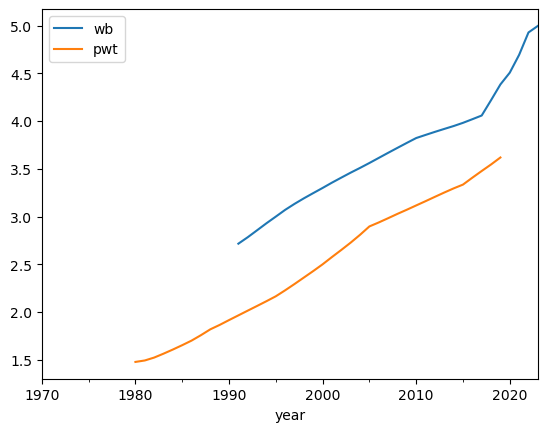

In [14]:
fig, ax = plt.subplots()
wb_data.working.plot(ax=ax, label='wb')
pwt_df.engaged.plot(ax=ax, label='pwt')
ax.legend()

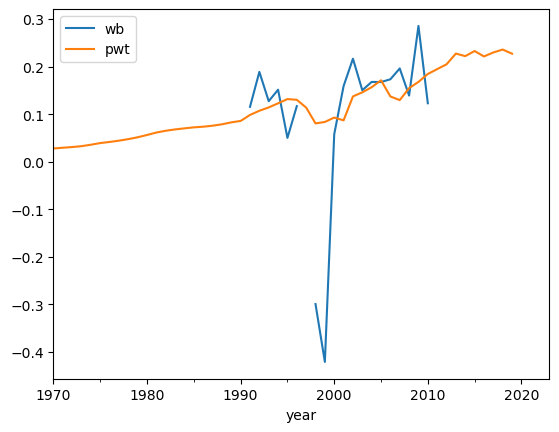

In [15]:
fig, ax = plt.subplots()
wb_data.real_interest.plot(ax=ax, label='wb')
pwt_df.P_capital_stock.plot(ax=ax, label='pwt')
ax.legend()

In [16]:
df = (pwt_df[['engaged', 'P_capital_stock', 'domestic_absorption', 'capital_stock', 'tfp']]
    .join(wb_data[['hh_consumption', 'gov_consumption', 'capital_formation']] * adj_factor.values[:, None])
    .join(wb_data[['cpi_inflation', 'lending_rate']])
    .assign(N = lambda x: x.eval('engaged * 8'))
    .drop(columns=['engaged'])
    .rename(columns={'P_capital_stock': 'r',
                     'domestic_absorption': 'Y',
                     'capital_stock': 'K',
                     'tfp': 'A',
                     'hh_consumption': 'C',
                     'gov_consumption': 'G',
                     'capital_formation': 'I',
                     'cpi_inflation': 'pi',
                     'lending_rate': 'i'}))

df.index.freq = df.index.inferred_freq

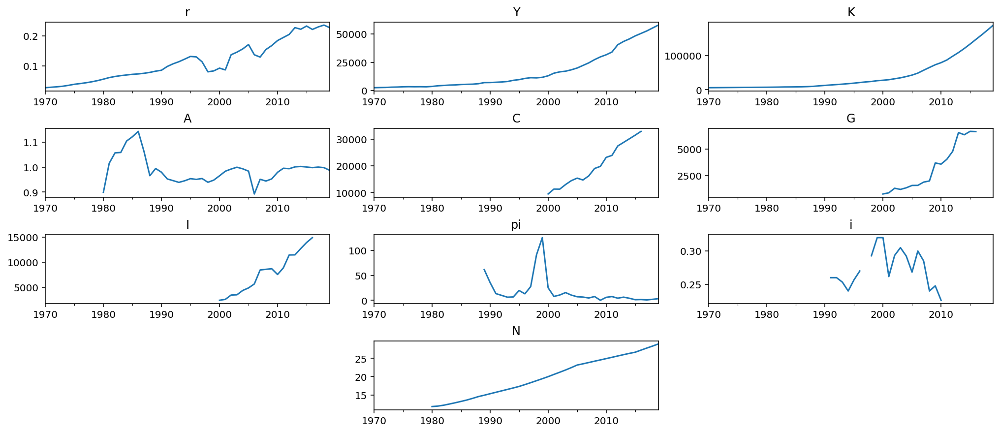

In [17]:
fig = plt.figure(figsize=(14, 6), dpi=144, layout='constrained')
gs, locs = prepare_gridspec_figure(n_cols = 3, n_plots=df.shape[1], figure=fig)
for loc, variable in zip(locs, df):
    axis = fig.add_subplot(gs[loc])
    df[variable].plot(ax=axis)
    axis.set(title=variable, xlabel='')
plt.show()

In [18]:
from pymc_extras.statespace import BayesianETS
from pymc_extras.inference.find_map import find_MAP
from pymc_extras.inference.laplace import fit_laplace

import pymc_extras as pmx
import preliz as pz
import pymc as pm
import arviz as az

In [19]:
to_detrend = ['Y', 'K', 'C', 'G', 'I', 'N', 'r']

mod = BayesianETS(order=('A', 'Ad', 'N'), 
                  endog_names=to_detrend,
                  trend=True,
                  damped_trend=True,
                  measurement_error=True,
                  stationary_initialization=True,
                  initialization_dampening=0.95)

prior_dict = {
    'alpha': pz.maxent(pz.Beta(), lower=0.8, upper=0.99, plot=False),
    'beta': pz.maxent(pz.Beta(), lower=0.8, upper=0.99, plot=False),
    'phi': pz.maxent(pz.Beta(), lower=0.8, upper=0.99, mass=0.99, plot=False),
    'sigma_state': pz.maxent(pz.Gamma(), lower=0.01, upper=10, plot=False),
    'sigma_obs': pz.maxent(pz.Gamma(), lower=0.5, upper = 3, mass=0.99, plot=False)
}

with pm.Model(coords=mod.coords) as m:
    initial_level = pm.Normal('initial_level', 
                              mu=df[to_detrend].apply(np.log).mean().values, 
                              sigma=3,
                             dims=['observed_state'])
    initial_trend = pm.Normal('initial_trend', 
                              mu=df[to_detrend].apply(np.log).diff().mean().values, 
                              sigma=0.1,
                              dims=['observed_state'])
    
    for var, dist in prior_dict.items():
        dist.to_pymc(name=var, dims=['observed_state'])

    mod.build_statespace_graph(df[to_detrend].apply(np.log), mode='JAX')

    # Don't need a precise full posterior here; just just laplace
    idata = pmx.fit(method='laplace',
                    optimize_method='trust-ncg',
                    use_grad=True,
                    use_hess=False,
                    use_hessp=True,
                    gradient_backend='jax',
                    compile_kwargs={'mode':'JAX'},
                    fit_in_unconstrained_space=True,
                    on_bad_cov='error',
                    optimizer_kwargs=dict(gtol=1e-12,
                                          max_trust_radius=1,
                                          initial_trust_radius=0.1)
                   )
    

                      Model Requirements                       
                                                               
  Variable        Shape   Constraints              Dimensions  
 ───────────────────────────────────────────────────────────── 
  initial_level   (7,)                    ('observed_state',)  
  initial_trend   (7,)                    ('observed_state',)  
  alpha           (7,)    0 < alpha < 1   ('observed_state',)  
  beta            (7,)    0 < beta < 1    ('observed_state',)  
  phi             (7,)    0 < phi < 1     ('observed_state',)  
  sigma_state     (7,)    Positive        ('observed_state',)  
  sigma_obs       (7,)    Positive        ('observed_state',)  
                                                               
These parameters should be assigned priors inside a PyMC model 
    block before calling the build_statespace_graph method.    

/Users/jessegrabowski/Documents/Python/pymc_extras/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)


Output()

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/arviz/data/inference_data.py:1546: UserWarning: The group fit is not defined in the InferenceData scheme
  warnings.warn(


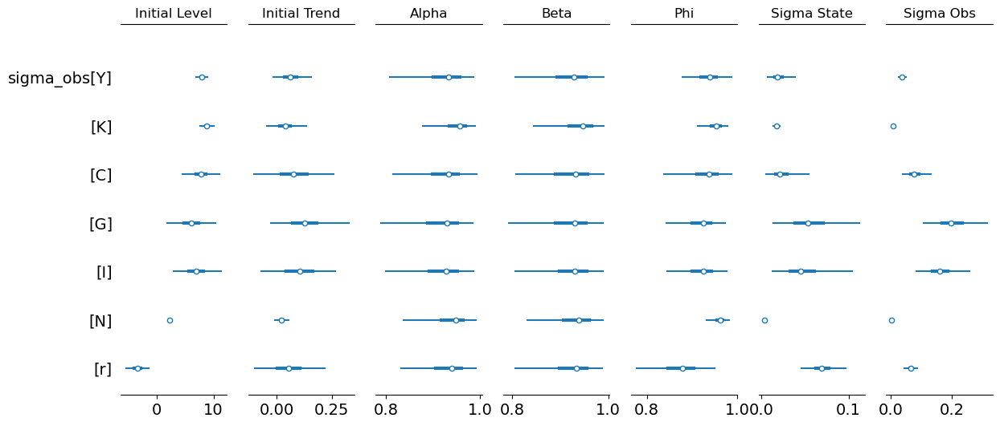

In [20]:
fig, ax = plt.subplots(1, len(m.free_RVs), figsize=(14, 6), sharey=True)
for var, axis in zip(m.free_RVs, fig.axes):
    az.plot_forest(idata, var_names=[var.name], ax=axis, combined=True)
    axis.set_title(var.name.replace('_', ' ').title())

In [21]:
post_cond = mod.sample_conditional_posterior(idata)

/Users/jessegrabowski/Documents/Python/pymc_extras/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x35CD36DC0>), RNG(<Generator(PCG64) at 0x35CD36CE0>), RNG(<Generator(PCG64) at 0x35CD36C00>), RNG(<Generator(PCG64) at 0x35CD36B20>), RNG(<Generator(PCG64) at 0x35CD36420>), RNG(<Generator(PCG64) at 0x36BBA8040>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


Output()

In [22]:
import xarray as xr

xr_df = df[to_detrend].unstack().rename_axis(['observed_state', 'time'], axis=0).to_xarray()
res = np.log(xr_df) - post_cond.smoothed_posterior_observed
hdi = az.hdi(res).x

hdi_range = (hdi.mean(dim='time')
                 .to_dataframe(())
                 .unstack('hdi')
                 .droplevel(axis=1, level=0)
                 .eval('higher - lower'))

# Use these as observation errors in the DSGE 
hdi_range.to_dict()

{'Y': 0.16181789170006494,
 'K': 0.038355570613415754,
 'C': 0.36241904704598105,
 'G': 0.914102890291246,
 'I': 0.7182168950133907,
 'N': 0.010943710747510538,
 'r': 0.3004737020290016}

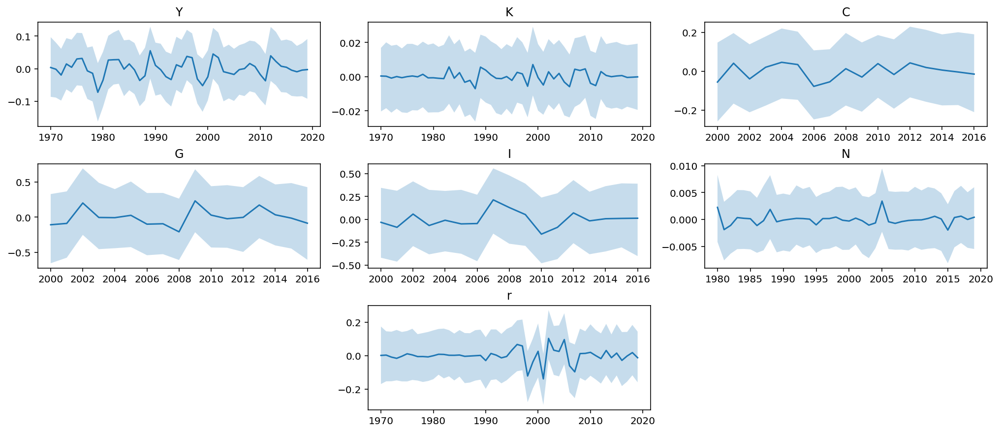

In [23]:
fig = plt.figure(figsize=(14, 6), dpi=144, layout='constrained')
gs, locs = prepare_gridspec_figure(n_cols = 3, n_plots=len(to_detrend), figure=fig)
for loc, variable in zip(locs, to_detrend):
    axis = fig.add_subplot(gs[loc])
    
    mu = res.sel(observed_state=variable).mean(dim=['chain', 'draw']).values
    
    axis.plot(df.index, mu)
    axis.fill_between(df.index, *hdi.sel(observed_state=variable).values.T, alpha=0.25)
    
    axis.set(title=variable, xlabel='')
plt.show()

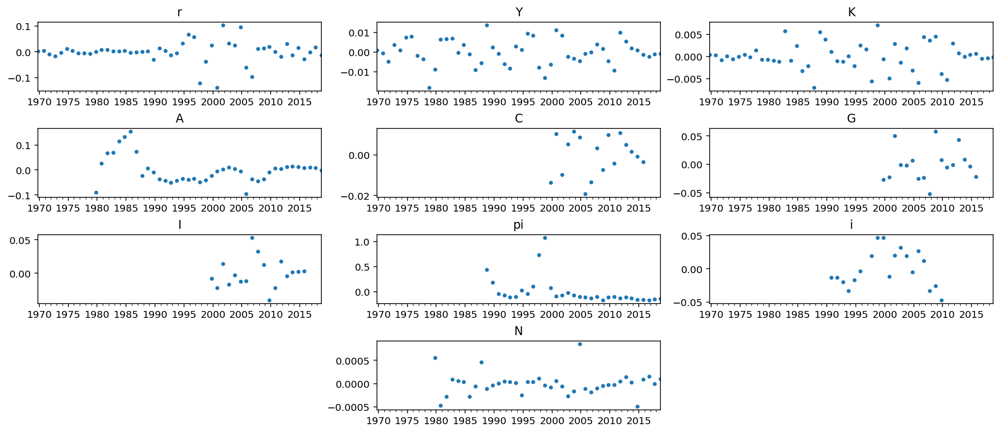

In [24]:
df_detrend = df.copy()
df_detrend[to_detrend] = res.mean(dim=['chain', 'draw']).to_dataframe()['x'].unstack('observed_state')[to_detrend]

df_detrend = df_detrend.resample('QS-DEC').last()

# Rescale flow variables to reflect switch to quarterly
flow_variables = ['Y', 'C', 'G', 'I', 'N']
df_detrend[flow_variables] = df_detrend[flow_variables] / 4

# Convert inflation to percentage
df_detrend['pi'] = df_detrend['pi'] / 100 

# Center stock variables
stock_variables = ['K', 'A', 'pi', 'i']
df_detrend[stock_variables] = df_detrend[stock_variables] - df_detrend[stock_variables].mean() 

fig = plt.figure(figsize=(14, 6), dpi=144, layout='constrained')
gs, locs = prepare_gridspec_figure(n_cols = 3, n_plots=df.shape[1], figure=fig)
for loc, variable in zip(locs, df):
    axis = fig.add_subplot(gs[loc])
    df_detrend[variable].plot(ax=axis, marker='o', markersize=3)
    axis.set(title=variable, xlabel='')
plt.show()

In [25]:
dsge_mod = ge.statespace_from_gcn('nk_complete_taxes.gcn',
                                  not_loglin_variables=['i', 'pi', 'pi_obj', 'tau_C', 'tau_K', 'tau_L'])

Model Building Complete.
Found:
	34 equations
	34 variables
		The following variables were eliminated at user request:
			D_t, K_d_t, N_i_t, TC_t, T_t, U_t, Y_j_t
		The following "variables" were defined as constants and have been substituted away:
			B_t
	12 stochastic shocks
		 0 / 12 has a defined prior. 
	35 parameters
		 27 / 35 parameters has a defined prior. 
	0 parameters to calibrate.
Model appears well defined and ready to proceed to solving.

Statespace model construction complete, but call the .configure method to finalize.


In [26]:
error_vars = ['N', 'K', 'A']
dsge_mod.configure(observed_states=df_detrend.columns,
                   measurement_error=error_vars,
                   constant_params=['pi_bar', 
                                    'phi_tau_C', 'phi_tau_K', 'phi_tau_L', 
                                    'psi',
                                    'tau_C', 'tau_K', 'tau_L'],
                   full_shock_covaraince=True,
                   solver='scan_cycle_reduction',
                   mode='JAX',
                   max_iter=20,
                   use_adjoint_gradients=True)

                              Model Requirements                              
                                                                              
  Variable        Shape      Constraints                          Dimensions  
 ──────────────────────────────────────────────────────────────────────────── 
  alpha           ()                                                    None  
  beta            ()                                                    None  
  chi             ()                                                    None  
  delta           ()                                                    None  
  epsilon_p       ()                                                    None  
  epsilon_w       ()                                                    None  
  gamma_I         ()                                                    None  
  phi_H           ()                                                    None  
  phi_Y           ()                                                    None  
  phi_p           ()                                                    None  
  phi_pi          ()                                                    None  
  phi_w           ()                                                    None  
  psi_z           ()                                                    None  
  rho_A           ()                                                    None  
  rho_G           ()                                                    None  
  rho_I           ()                                                    None  
  rho_beta        ()                                                    None  
  rho_i           ()                                                    None  
  rho_markup      ()                                                    None  
  rho_markup_w    ()                                                    None  
  rho_pi_dot      ()                                                    None  
  rho_tau_C       ()                                                    None  
  rho_tau_K       ()                                                    None  
  rho_tau_L       ()                                                    None  
  rho_theta       ()                                                    None  
  sigma           ()         Positive                                   None  
  theta           ()                                                    None  
  state_cov       (12, 12)   Positive Semi-Definite   ('shock', 'shock_aux')  
  error_sigma_N   ()                                                    None  
  error_sigma_K   ()                                                    None  
  error_sigma_A   ()                                                    None  
                                                                              
 These parameters should be assigned priors inside a PyMC model block before  
                  calling the build_statespace_graph method.                  

In [27]:
df_detrend[error_vars].std()

N    0.000239
K    0.003004
A    0.053116
dtype: float64

In [28]:
def make_error_prior(name, trend_error):
#     if name in trend_error:
#         error = trend_error[name]
    return pz.maxent(pz.Gamma(), lower=0, upper=df_detrend[name].std(), plot=False)
#     return pz.maxent(pz.Gamma(), lower=0.1, upper=0.5, plot=False)
    
error_priors = {
    f'error_sigma_{var}' : make_error_prior(var, hdi_range.to_dict())
    for var in error_vars
}
sigma_priors = {
    f'sigma_{var}': pz.maxent(pz.Exponential(), lower=0.001, upper=0.1, plot=False)
    for var in dsge_mod.shock_names
}

In [29]:
n_shocks = dsge_mod.k_posdef

A_params = pz.maxent(pz.Gamma(), lower=0.1, upper=0.5, plot=False).params_dict
other_params = pz.maxent(pz.Gamma(), lower=0.1, upper=0.5, plot=False).params_dict

std_priors = [pz.Gamma(**A_params)] + [pz.Gamma(**other_params)] * (n_shocks - 1)

sd_dist = pm.Gamma.dist(alpha=[A_params['alpha']] + [other_params['alpha']] * (n_shocks - 1),
                        beta=[A_params['beta']] + [other_params['beta']] * (n_shocks - 1))

In [30]:
with pm.Model(coords=dsge_mod.coords) as pm_mod:
    dsge_mod.to_pymc()
#     for name, prior in (error_priors | sigma_priors).items():
    for name, prior in error_priors.items():
        prior.to_pymc(name=name)
    chol, *_ = pm.LKJCholeskyCov('state_chol', 
                                 n=dsge_mod.k_posdef, 
                                 eta=10, 
                                 sd_dist=sd_dist)
    cov = pm.Deterministic('state_cov', chol @ chol.T, dims=['shock', 'shock_aux'])

    dsge_mod.build_statespace_graph(df_detrend,
                                    add_norm_check=True,
                                    add_solver_success_check=True,
                                    add_steady_state_penalty=True)

/Users/jessegrabowski/Documents/Python/pymc_extras/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)


In [29]:
ntp_mod = ntp.compile_pymc_model(freeze_dims_and_data(pm_mod), 
                                 backend='jax', 
                                 gradient_backend='jax',
                                 default_initialization_strategy='prior',
                                 jitter_rvs=set(),
#                                  initial_points=None)
                                 initial_points={k: v for k, v in dsge_mod.param_dict.items() if k in pm_mod})

KeyboardInterrupt: 

In [ ]:
# scheduler = optax.exponential_decay(init_value=0.1, transition_steps=1000, decay_rate=0.99)

# Hyperparameters for the scheduler.
base_learning_rate = 1e-3  # Target learning rate after warm-up.
warmup_steps = 200        # Number of steps to linearly increase the learning rate.
decay_steps = 800       # Number of steps over which to decay the learning rate.
min_learning_rate = 1e-5   # Minimum learning rate after decay.

# Warm-up: linearly increase the learning rate from 0 to base_learning_rate.
warmup_schedule = optax.linear_schedule(
    init_value=0.0,
    end_value=base_learning_rate,
    transition_steps=warmup_steps
)

# Cosine decay: gradually reduce the learning rate from base_learning_rate to min_learning_rate.
decay_schedule = optax.cosine_decay_schedule(
    init_value=base_learning_rate,
    decay_steps=decay_steps,
    alpha=min_learning_rate / base_learning_rate  # The final fraction of base_learning_rate.
)

# Combine the warm-up and decay phases into one schedule.
scheduler = optax.join_schedules(
    schedules=[warmup_schedule, decay_schedule],
    boundaries=[warmup_steps]  # After warmup_steps, switch to the cosine decay.
)

base_optimizer = optax.chain(
    optax.clip_by_global_norm(1.0),
    optax.apply_if_finite(
        optax.adamw(learning_rate=scheduler),
        max_consecutive_errors=5
    )
)

make_optimizer = lambda: base_optimizer

In [ ]:
n_params = sum([np.prod(x.shape.eval()) for x in pm_mod.rvs_to_values.keys() if x not in pm_mod.observed_RVs])

In [ ]:
# idata = ntp.sample(ntp_mod.with_transform_adapt(verbose=True, 
#                                                 learning_rate=scheduler,
#                                                 nn_width=[128, 512, 128],
#                                                 num_layers=3,
#                                                 batch_size=512,
#                                                 max_patience=1000,
#                                                 extension_windows=[],
#                                                 zero_init=False,
#                                                 dct_layer=True,
#                                                 extend_dct=False,
#                                                 show_progress=False,
#                                                 householder_layer=True,
#                                                 make_optimizer=make_optimizer),
#                    tune=1000, 
#                    draws=1000,
#                    chains=4,
#                    target_accept=0.9,
#                    transform_adapt=True)
# az.to_netcdf(idata, 'laos_dsge_results_7.netcdf')
idata = az.from_netcdf('laos_dsge_results_7.netcdf')

<Axes: >

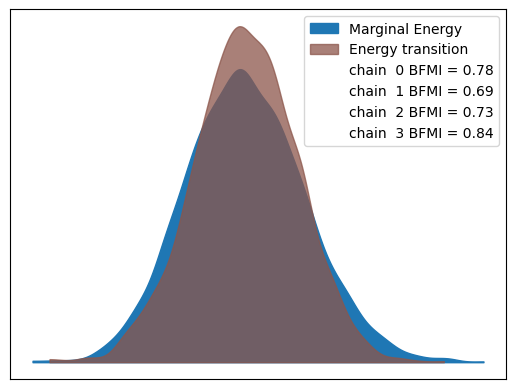

In [28]:
az.plot_energy(idata)

In [67]:
deep_params =['alpha', 'beta', 'delta', 'sigma', 'theta', 'chi', 'gamma_I', 'epsilon_p', 'epsilon_w', 'phi_H', 'phi_p', 'phi_w', 'psi_z', 'phi_pi', 'phi_Y']
rho_params = [rv.name for rv in pm_mod.free_RVs if rv.name.startswith('rho')]
all_params = [rv.name for rv in pm_mod.free_RVs if 'error' not in rv.name and 'state_chol' not in rv.name]
error_params = [rv.name for rv in pm_mod.free_RVs if rv.name.startswith('error')]
sigma_params = [rv.name for rv in pm_mod.free_RVs if rv.name in sigma_priors]


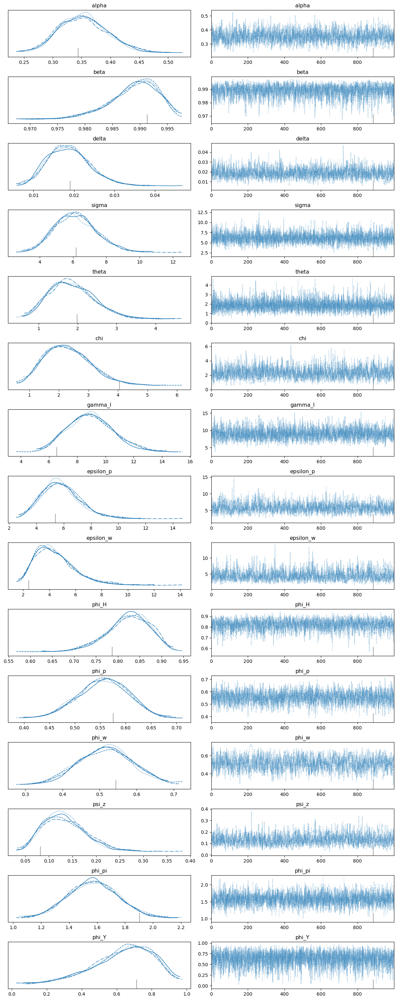

In [30]:
az.plot_trace(idata, var_names=deep_params);
plt.tight_layout()

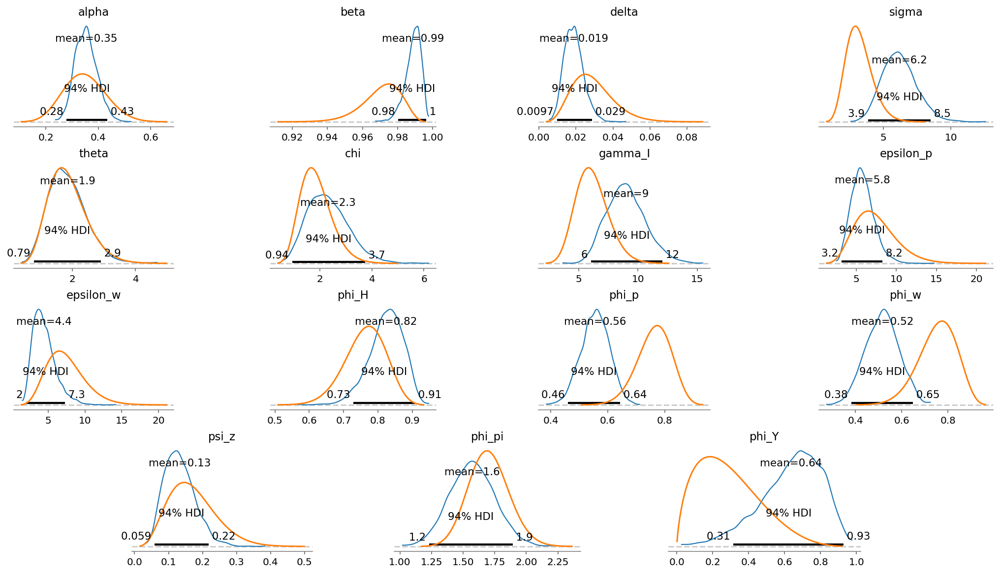

In [31]:
all_priors = dsge_mod.param_priors | dsge_mod.shock_priors

gp.plot_posterior_with_prior(idata, 
                             deep_params,
                             all_priors,
                             n_cols=4,
                             fig_kwargs={'dpi':144, 'layout':'constrained', 'figsize':(14,8)});

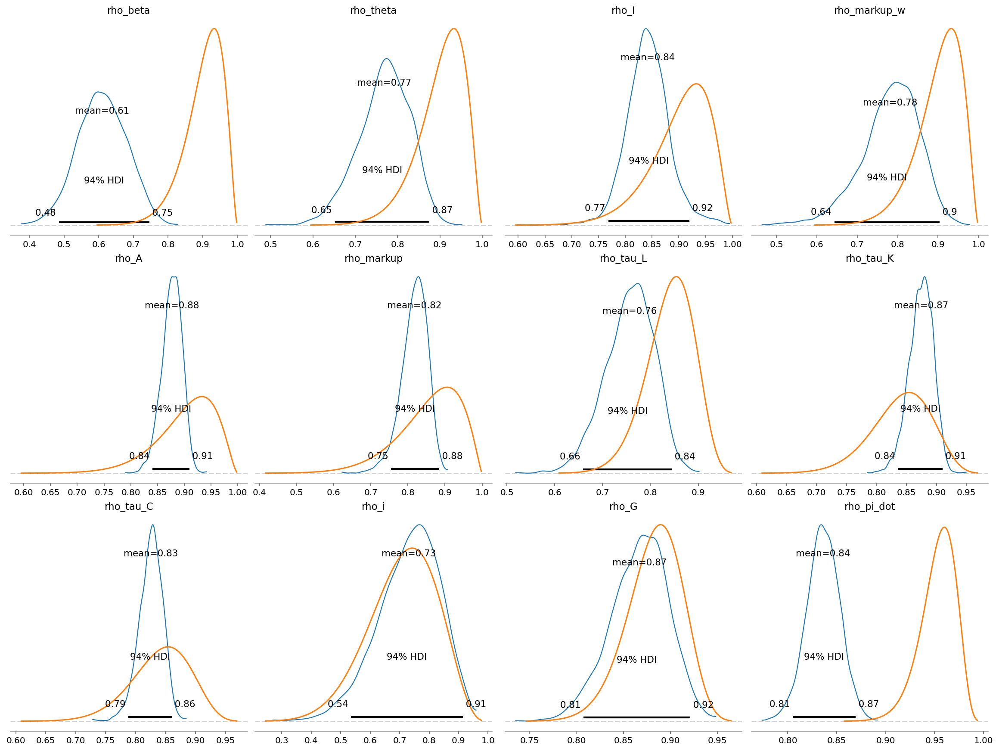

In [32]:
gp.plot_posterior_with_prior(idata, 
                          rho_params,
                          all_priors,
                          n_cols=4,
                          fig_kwargs={'dpi':144, 'layout':'constrained', 'figsize':(16, 12)});

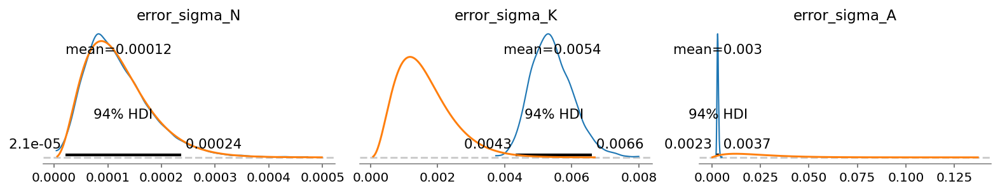

In [33]:
gp.plot_posterior_with_prior(idata, 
                          error_params,
                          all_priors | error_priors,
                          n_cols=4,
                          fig_kwargs={'dpi':144, 'layout':'constrained', 'figsize':(14,2)});

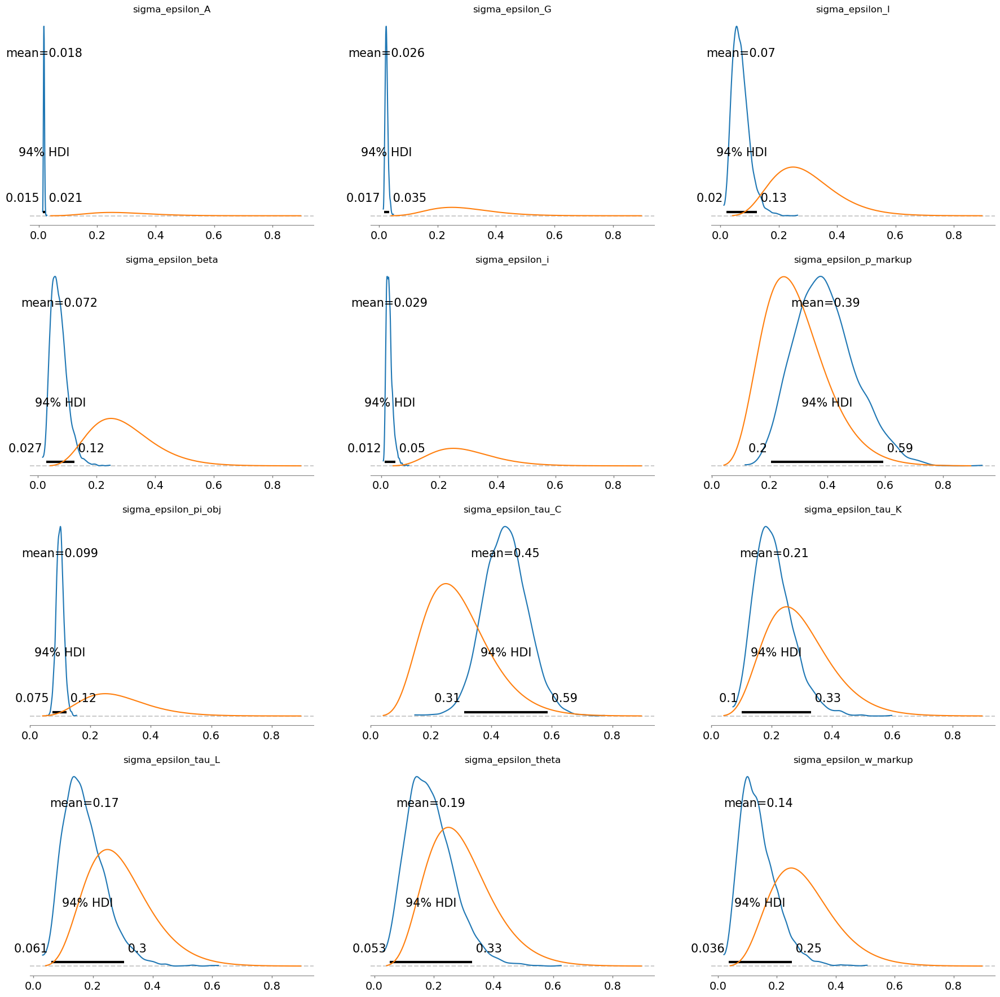

In [34]:
axes = az.plot_posterior(idata, var_names=['state_chol_stds'], filter_vars='like');
for d, axis, shock in zip(std_priors, axes.ravel(), dsge_mod.shocks):
    d.plot_pdf(ax=axis, color='tab:orange', legend=False)
    axis.set_title(f'sigma_{shock.base_name}')

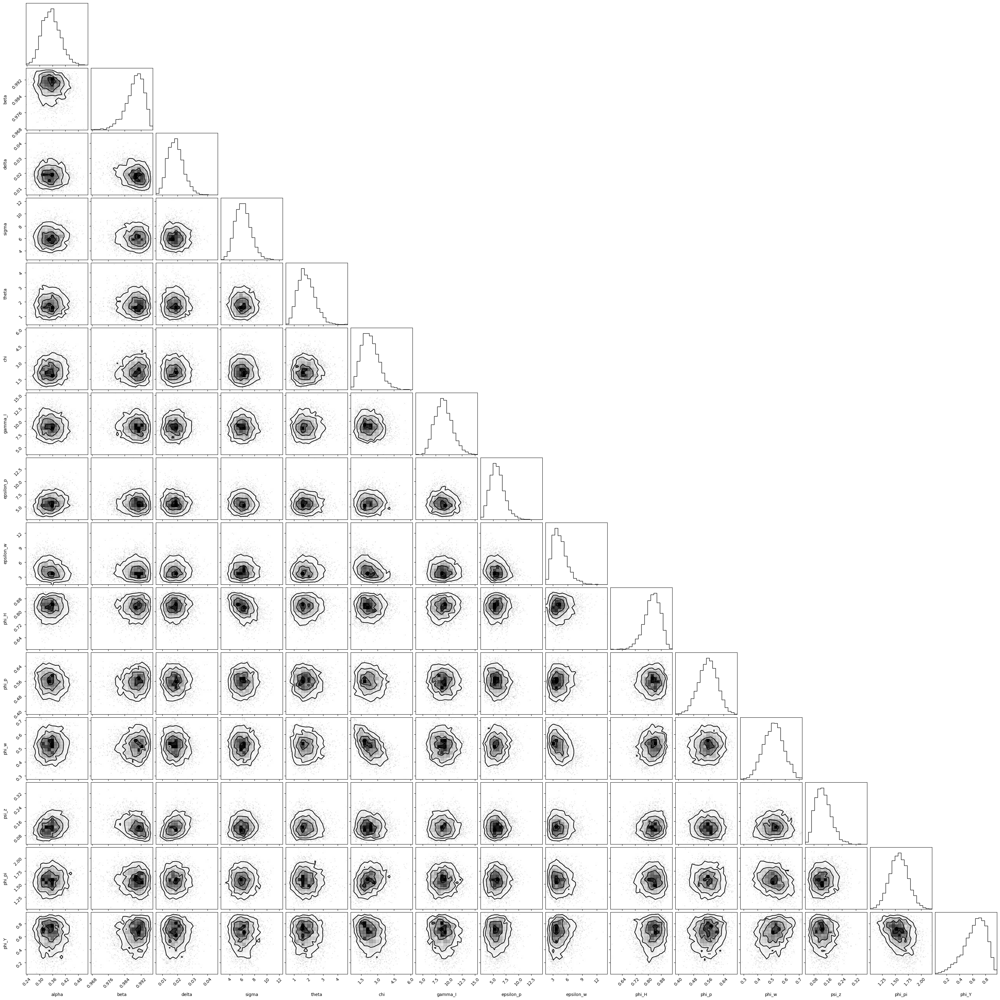

In [35]:
from corner import corner

corner(idata, 
       var_names=deep_params, 
       divergences=False, 
       divergences_kwargs={'markersize':4, 'color':'tab:red'});

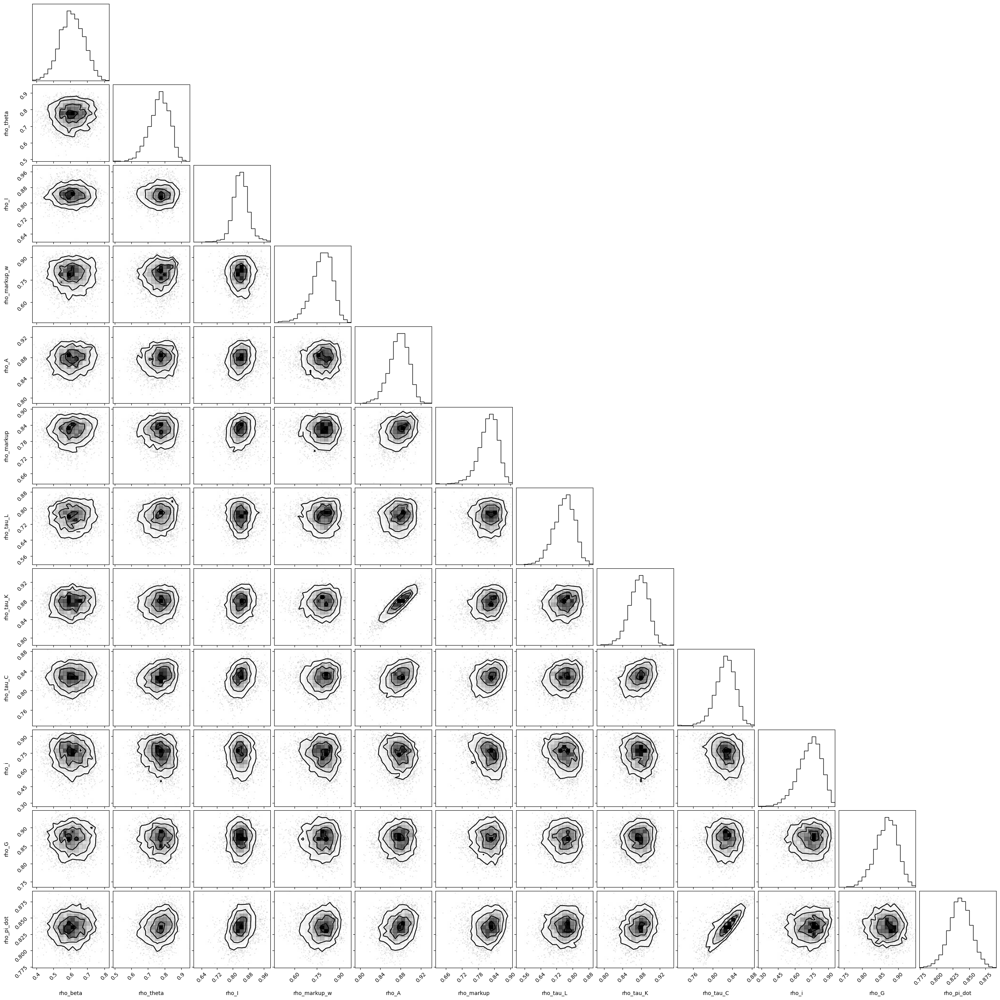

In [36]:
corner(idata, 
       var_names=rho_params, 
       divergences=False, 
       divergences_kwargs={'markersize':4, 'color':'tab:red'});

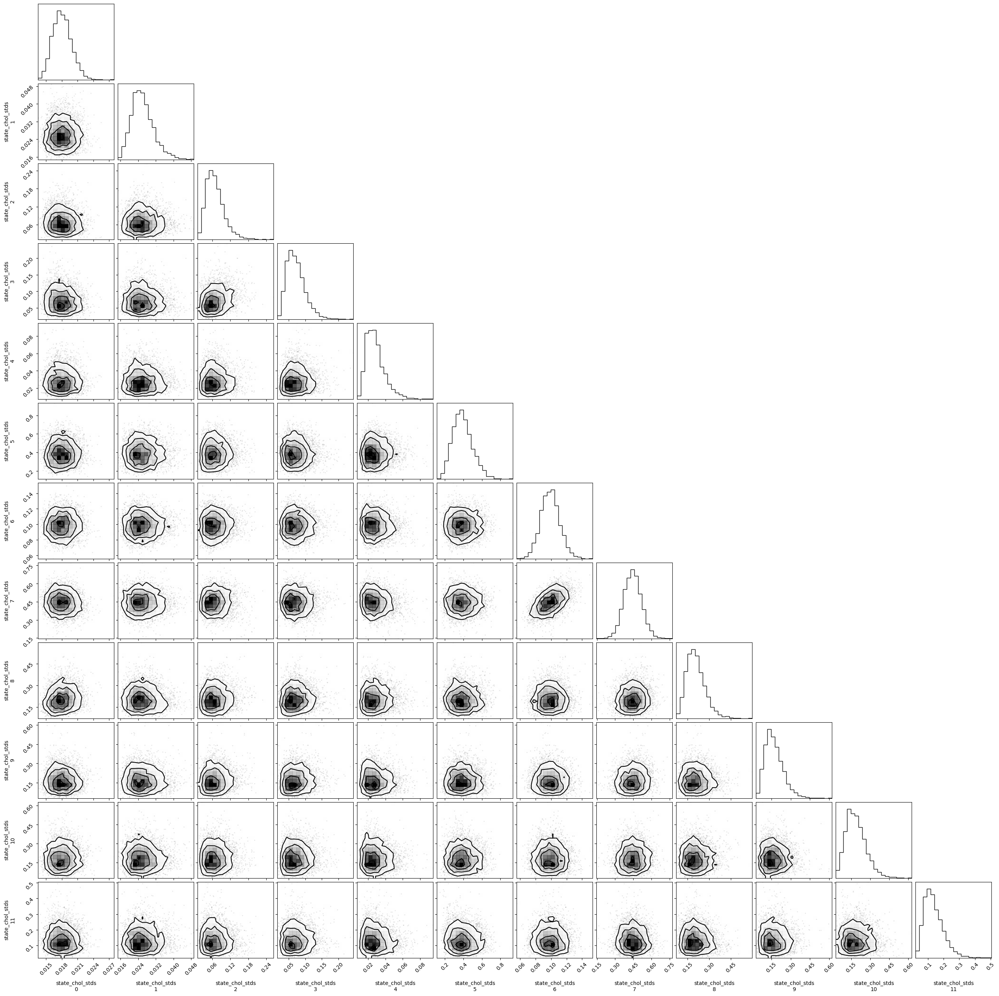

In [37]:
corner(idata, 
       var_names=['state_chol_stds'], 
       filter_vars='like',
       divergences=False, 
       divergences_kwargs={'markersize':4, 'color':'tab:red'});

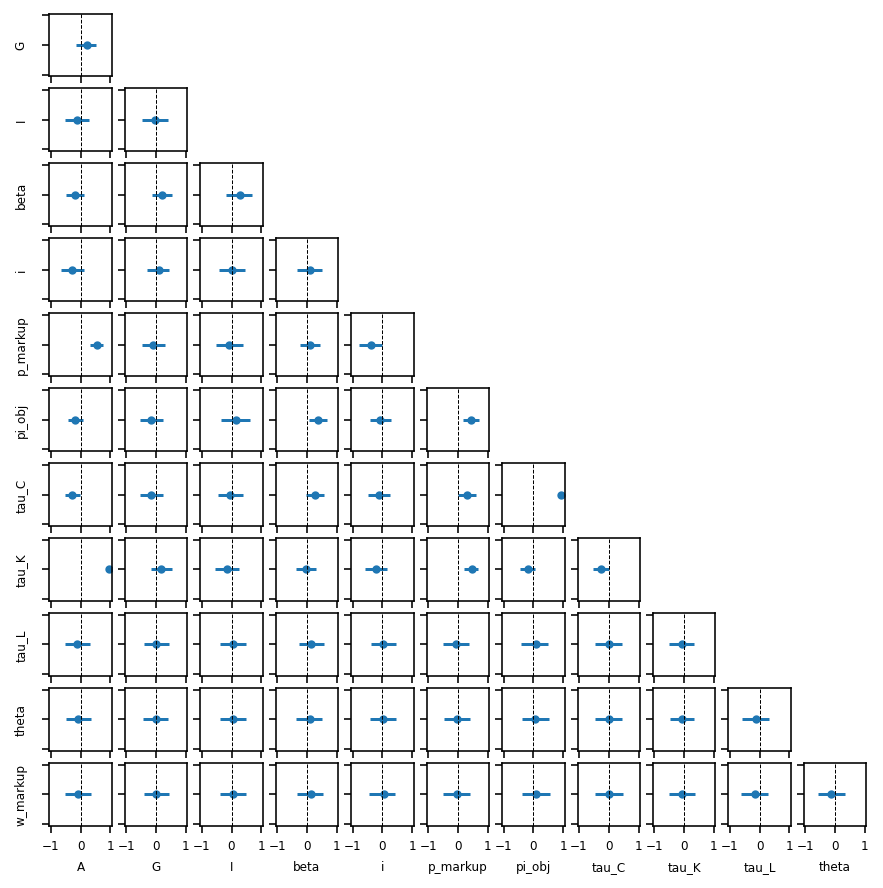

In [38]:
from itertools import product

n_shocks = dsge_mod.k_posdef

fig, ax = plt.subplots(n_shocks,
                      n_shocks,
                      figsize=(8, 8),
                      dpi=144,
                      subplot_kw={'aspect':'equal'},
                      sharex=True,
                      sharey=True)

mu = idata.posterior.state_chol_corr.mean(dim=['chain', 'draw'])
hdi = az.hdi(idata.posterior.state_chol_corr).state_chol_corr
ax[0, 0].set(xlim=(-1.05, 1.05), ylim=(-1.05, 1.05))

for i, j in product(range(n_shocks), range(n_shocks)):
    axis = ax[i, j]
    if i <= j:
        axis.set_visible(False)
        continue
    
    y_var = dsge_mod.shocks[i].base_name
    x_var = dsge_mod.shocks[j].base_name
    
    axis.scatter(mu.values[i, j], 0, s=10)
    axis.hlines(0, *hdi.values[i, j])
    axis.axvline(0, ls='--', c='k', lw=0.5)
    
    axis.set_ylabel(y_var.replace("epsilon_", "") if j == 0 else "", fontsize=6)
    axis.set_xlabel(x_var.replace("epsilon_", "") if i == (n_shocks - 1) else "", fontsize=6)

    axis.set_yticklabels([])
    axis.tick_params(axis='x', labelsize=6)

In [39]:
cond_post = dsge_mod.sample_conditional_posterior(idata)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0xABEA5EC00>), RNG(<Generator(PCG64) at 0xABEA5EB20>), RNG(<Generator(PCG64) at 0xABEA5EA40>), RNG(<Generator(PCG64) at 0xABEA5E960>), RNG(<Generator(PCG64) at 0xABEA5E880>), RNG(<Generator(PCG64) at 0xAC037B920>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


Output()

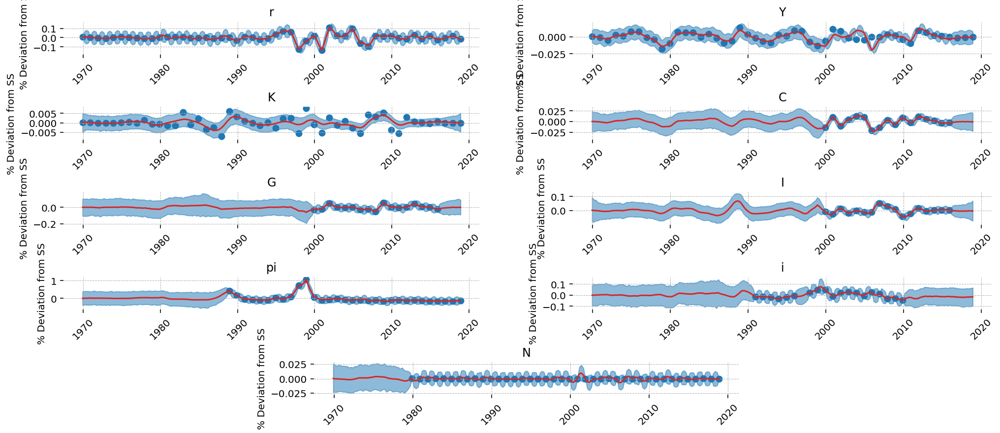

In [40]:
fig = gp.plot_kalman_filter(cond_post, 
                      df_detrend.drop(columns=['A']), 
                      kalman_output='smoothed', 
                      vars_to_plot=df_detrend.drop(columns=['A']).columns, 
                      n_cols=2);
for axis in fig.axes:
    var = axis.get_title()
    
    axis.scatter(df_detrend[var].index, df_detrend[var].values)

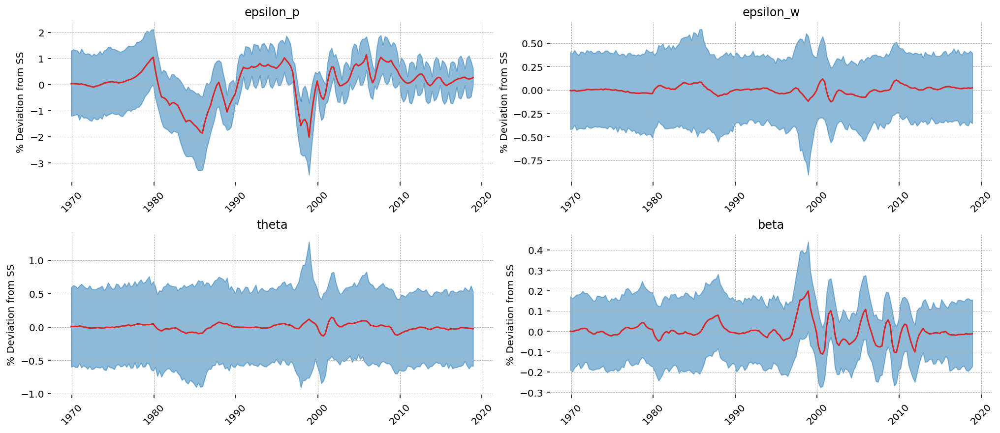

In [154]:
fig = gp.plot_kalman_filter(cond_post, 
                            df_detrend,
                      kalman_output='smoothed', 
                      vars_to_plot=['epsilon_p', 'epsilon_w', 'theta', 'beta'], 
                      n_cols=2);

In [66]:
dsge_mod.shock_names

['epsilon_A',
 'epsilon_G',
 'epsilon_I',
 'epsilon_beta',
 'epsilon_i',
 'epsilon_p_markup',
 'epsilon_pi_obj',
 'epsilon_tau_C',
 'epsilon_tau_K',
 'epsilon_tau_L',
 'epsilon_theta',
 'epsilon_w_markup']

In [67]:
shock_size = np.zeros(dsge_mod.k_posdef)

idx = dsge_mod.shock_names.index('epsilon_p_markup')
shock_size[idx] = 1.0

irf = dsge_mod.impulse_response_function(idata,
                                         n_steps=40,
                                         shock_size=shock_size)

Sampling: []


Output()

In [80]:
def plot_irf(irf, vars_to_plot, n_cols=2):
    n_plots = len(vars_to_plot)
    n_cols = min(n_plots, n_cols)
    fig = plt.figure(figsize=(14, 8), dpi=144, layout='constrained')
    gs, locs = gp.prepare_gridspec_figure(n_cols=n_cols, n_plots=n_plots, figure=fig)
    
    data = irf.irf.sel(state=vars_to_plot)
    
    mu = data.mean(dim=['chain', 'draw'])
    hdi = az.hdi(data).irf
    time = mu.time
    
    for variable, loc in zip(vars_to_plot, locs):
        axis = fig.add_subplot(gs[loc])
        axis.plot(time, mu.sel(state=variable))
        axis.fill_between(time, *hdi.sel(state=variable).values.T, alpha=0.2)
        axis.set_title(variable)

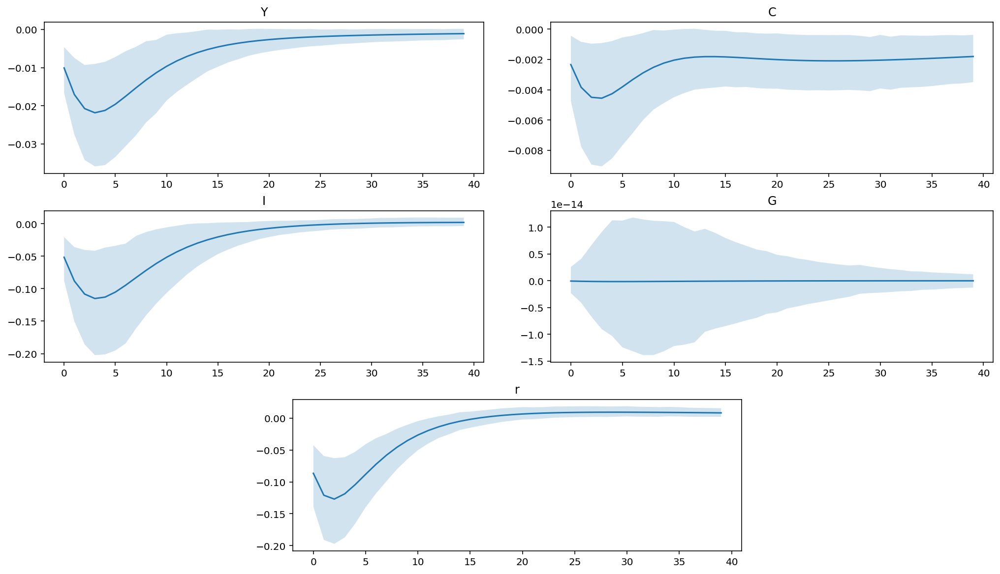

In [81]:
plot_irf(irf, ['Y', 'C', 'I', 'G', 'r'])